# Analisi dei cluster
Ora che si è determinato il numero di feature e l'algoritmo da usare per il clustering, si analizzano le varie opzioni, cercando di capire se esistano strutture interessanti all'interno dei cluster trovati oppure no. 

> Si parte con 8 varaibili di clustering, andando poi a toglierle. 

In [33]:
#################################
# import                        #
#################################
import pandas as pd 
import numpy as np 
from dataset_extended_class import dataframe_ext
from sklearn import cluster
import matplotlib.pyplot as plt 
import seaborn as sns
import hdbscan 
#dataset
df = pd.read_csv("../DatasetClientClustering.csv", 
                 engine='c', 
                 sep=',', 
                 encoding='latin-1')
df = df.drop(df.columns[list(np.arange(8))], axis=1)
df = df.drop(columns=["ClientID"])

#ora importo la tabella dei rankings
rankings = (pd.read_csv("SRANKresults.csv", sep = ";", index_col = [0])
             .sort_values(by = "score_final", ascending = False))
rankings

,feature,score_final
0,InheritanceIndex,309
1,Age,274
2,IncomeNeed,232
3,RiskPropension,216
4,ClientInvestmentHorizon,106
5,ClientKnowledgeExperience,81
6,ProtectionNeed,81
7,LongTermCareNeed,73
8,ClientPotentialIndex,68


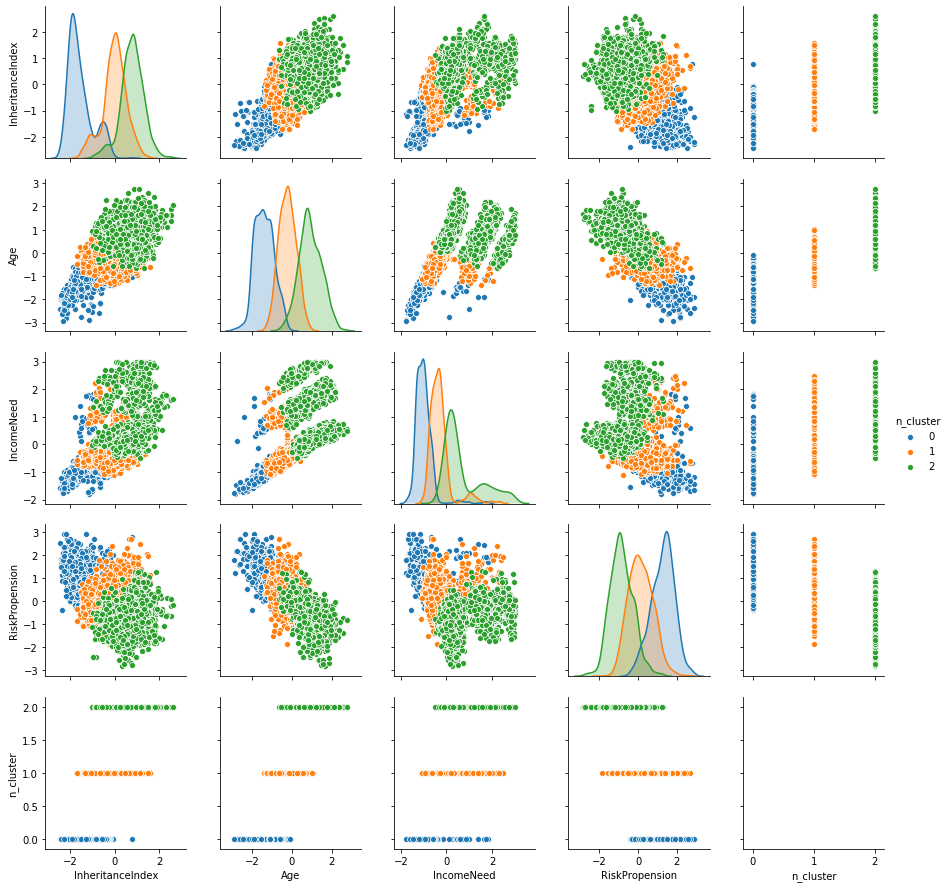

In [56]:
#################################
# PRIME 5 VARIABILI             #
#################################
#come indicato dalla feature selection, partiamo dalle 8 features 
features = list(rankings.iloc[0:4]["feature"])
data = dataframe_ext(df[features]).standardize().clean().df

#applico l'algoritmo di clustering come indicato dalla feature selection
model = cluster.KMeans(n_clusters = 3, n_jobs = 8)
model.fit(data)
labels = model.labels_
data["n_cluster"] = labels
sns.pairplot(data, hue = "n_cluster")

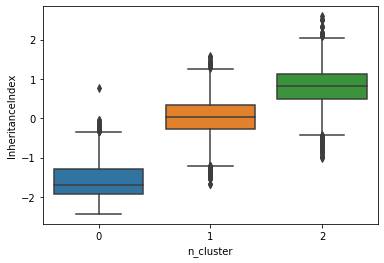

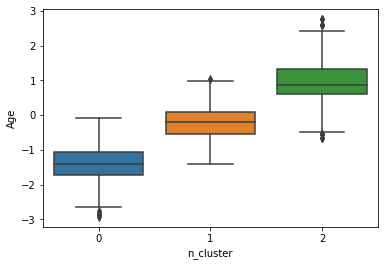

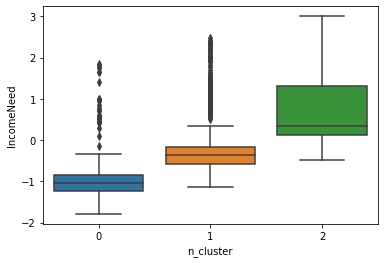

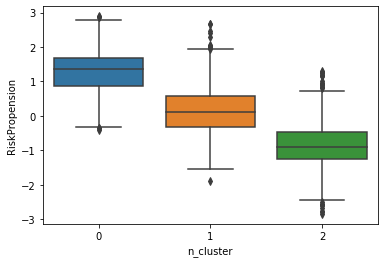

In [57]:
for i in features:
    sns.boxplot(x = "n_cluster", y = i, data = data)
    plt.show()